In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter, StrMethodFormatter

In [9]:
plt.style.use('default')
plt.rc('font', size=18)
plt.rc('axes', titlesize=24)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=18)

plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 100

In [10]:
endpoints = ['do-register', 'add-company', 'get-stock-data', 'get-stock-users-and-companies', 'add-buy-offer', 'add-sell-offer']
dataToPlot = ['apiTime', 'queueSizeBack', 'queueSizeForward']
folders = ['3600s']

In [11]:
hardware = '8CPU_20RAM'

In [4]:
#hardware = '12CPU_30RAM'

In [5]:
#tests = ['2repl','4repl', '5repl', '6repl']

In [12]:
tests = ['trans_60s', 'trans_120s', 'trans_180s', 'trans_240s', 'trans_300s']

In [7]:
#tests = ['req_250ms', 'req_500ms', 'req_1000ms', 'req_2000ms']

In [8]:
#tests = ['A1_100-A2_100-A3_100', 'A1_200-A3_100', 'A2_200', 'A2_200-A3_100', 'A3_200']

C:\Users\kalon\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


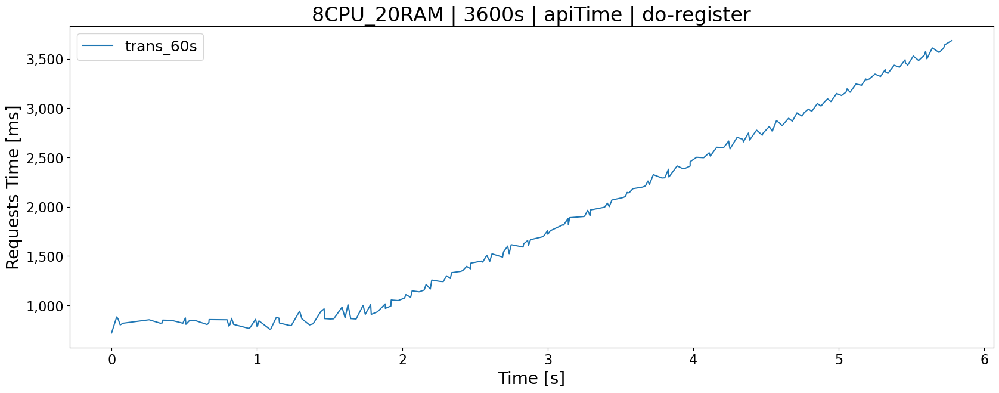

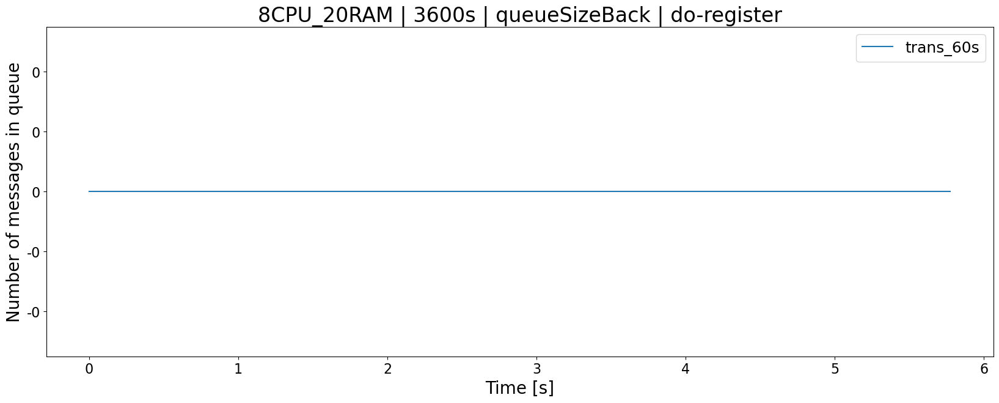

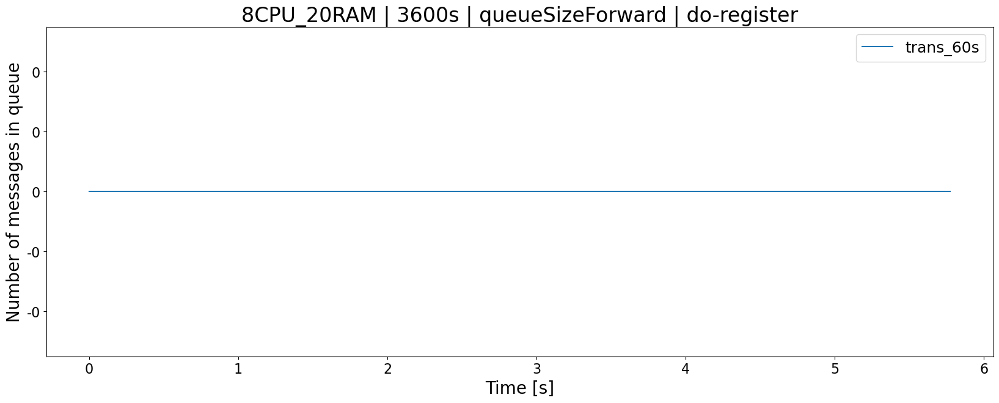

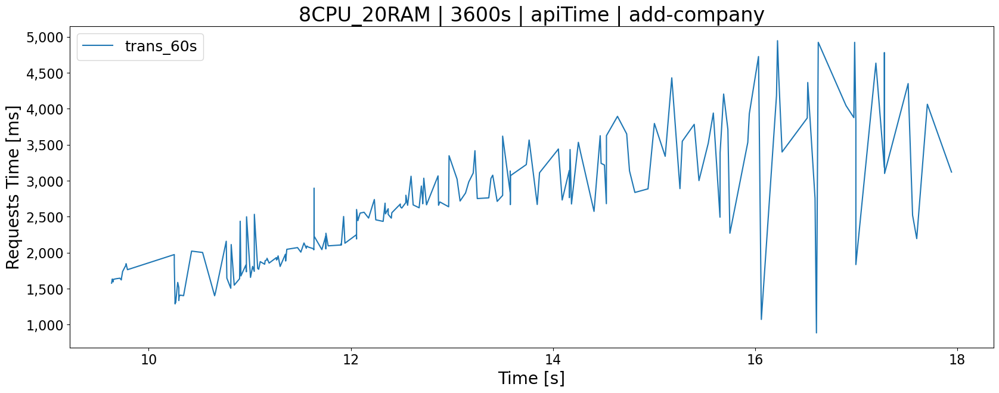

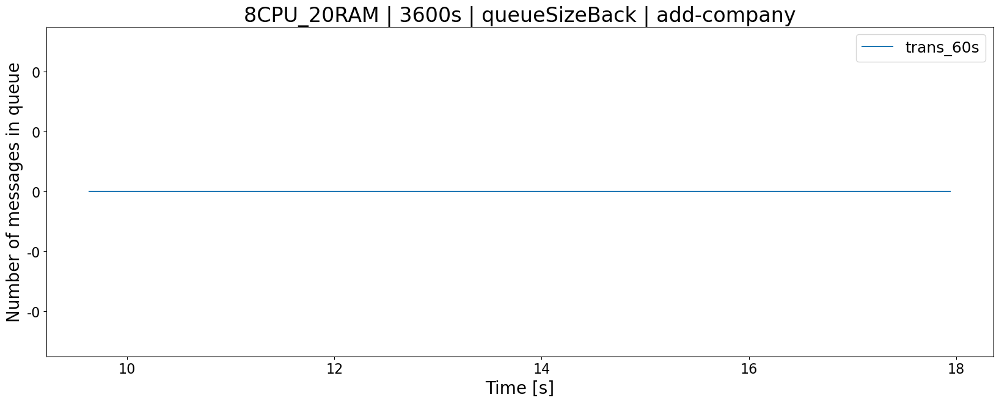

...

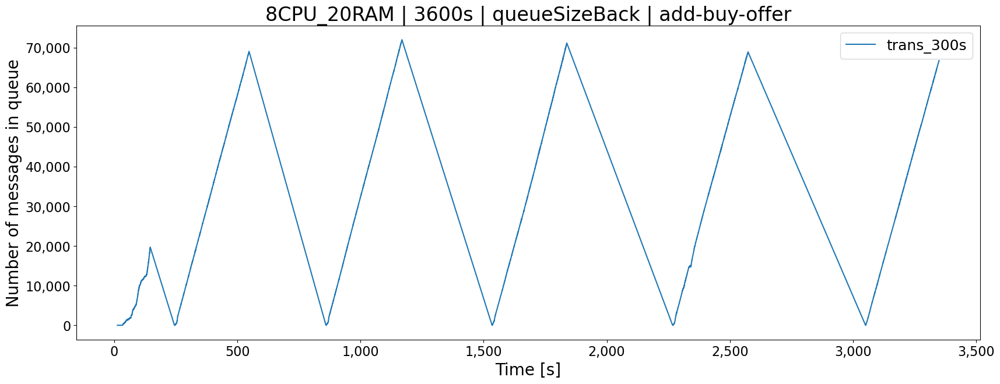

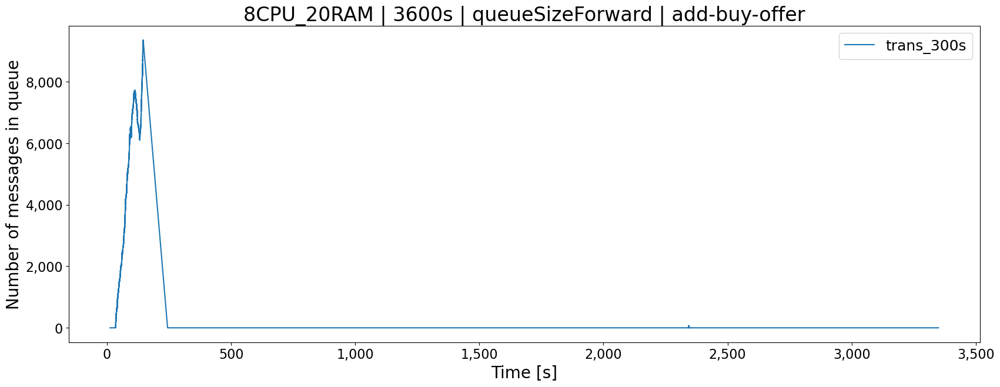

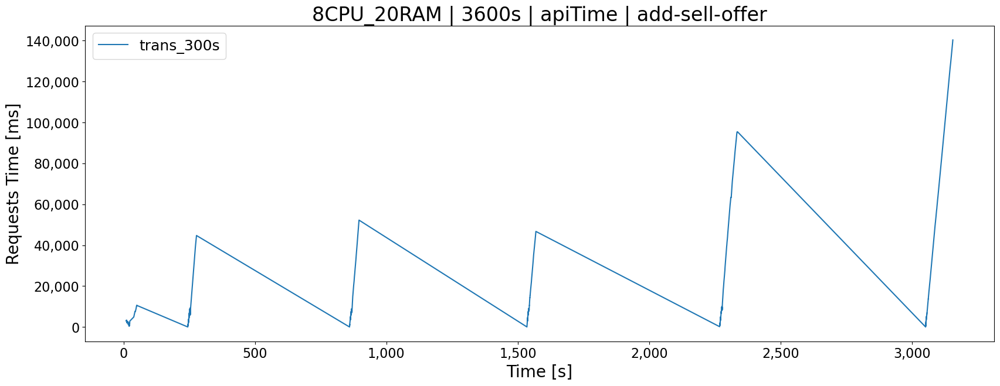

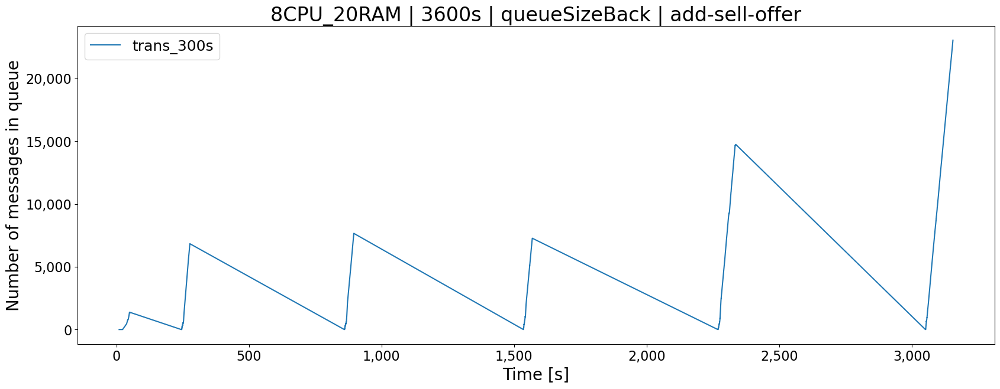

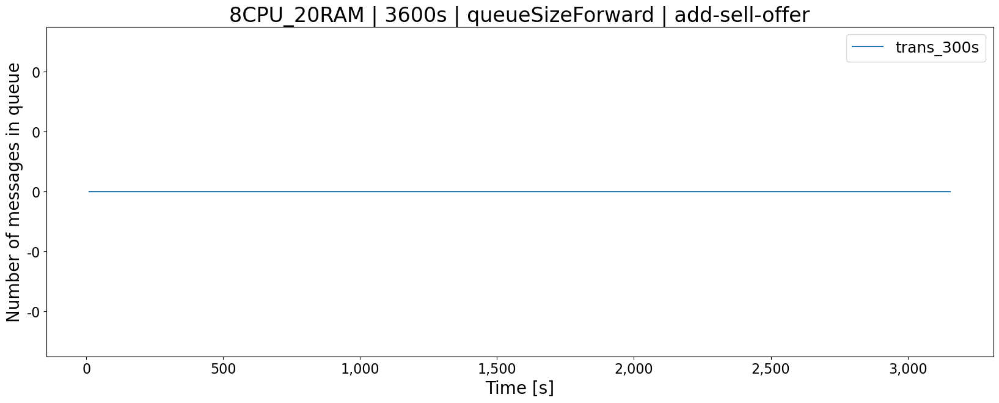

In [13]:
for f in folders:
    for i in tests:
        try:
            d = pd.read_csv(hardware + '/' + f + '/' + i + '/methods.csv', low_memory=False)
        except:
            continue
        for e in endpoints:
            for j in dataToPlot:  
                data = pd.DataFrame()
                #data.dropna()
                d = d.sort_values(by=['timestamp'])
                t = d['timestamp'][0]
                d['Time [s]'] = d['timestamp'].apply(lambda x: (x - t)/1000)
                customDataFrame = pd.DataFrame({'Time [s]': d[(d['endpointUrl'] == e)]['Time [s]'], i: d[(d['endpointUrl'] == e)][j]})
                customDataFrame = customDataFrame.loc[customDataFrame['Time [s]'] < int(f[:-1])]
                data = pd.concat([data, customDataFrame])
                ax = data.set_index('Time [s]').plot(figsize=(20, 7), title = hardware + ' | ' + f + ' | ' + j + ' | ' + e)
                if j == 'apiTime':

                    ax.set_ylabel("Requests Time [ms]")
                else:
                    ax.set_ylabel("Number of messages in queue")

                #plt.legend(loc='lower right')
                ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
                ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))